# Boxcar for Image-Derived Input Functions

## Setup

In [1]:
# system functions that are always useful to have
import time, sys, os

# basic numeric setup
import numpy as np

# inline plotting
%matplotlib inline

# plotting
import matplotlib
from matplotlib import pyplot as plt

# seed the random number generator
rstate = np.random.default_rng(916301)

In [2]:
# re-defining plotting defaults
from matplotlib import rcParams
rcParams.update({'xtick.major.pad': '7.0'})
rcParams.update({'xtick.major.size': '7.5'})
rcParams.update({'xtick.major.width': '1.5'})
rcParams.update({'xtick.minor.pad': '7.0'})
rcParams.update({'xtick.minor.size': '3.5'})
rcParams.update({'xtick.minor.width': '1.0'})
rcParams.update({'ytick.major.pad': '7.0'})
rcParams.update({'ytick.major.size': '7.5'})
rcParams.update({'ytick.major.width': '1.5'})
rcParams.update({'ytick.minor.pad': '7.0'})
rcParams.update({'ytick.minor.size': '3.5'})
rcParams.update({'ytick.minor.width': '1.0'})
rcParams.update({'font.size': 30})

In [3]:
import dynesty
from Boxcar import Boxcar

In [4]:
# define model
input_func_measurement = '/Volumes/PrecunealSSD/Singularity/CCIR_01211/derivatives/sub-108293/ses-20210421150523/pet/sub-108293_ses-20210421150523_trc-oo_proc-MipIdif_idif.nii.gz'
assert os.path.isfile(input_func_measurement), f"{input_func_measurement} was not found."
bc = Boxcar(input_func_measurement)
ifm = bc.input_func_measurement

# timesMid sampled non-uniformly
x = ifm['timesMid']

# generate noisy observations
data = {'timesMid': x, 'taus': ifm['taus'], 'v': bc.truths}
data


{'timesMid': array([ 5.,  6.,  7.,  8.,  9., 10., 11., 12., 13., 14., 15., 16., 17.,
        18., 19., 20., 21., 22., 23., 24., 25., 26., 27., 28., 29., 30.,
        31., 32., 33., 34., 40., 80.]),
 'taus': array([10., 10., 10., 10., 10., 10., 10., 10., 10., 10., 10., 10., 10.,
        10., 10., 10., 10., 10., 10., 10., 10., 10., 10., 10., 10., 10.,
        10., 10., 10., 10., 20., 20.]),
 'v': [10.13,
  12.97,
  15.77,
  0.95,
  5.29,
  1.17,
  -0.57,
  -0.53,
  61.28,
  0.04,
  0.02,
  0.07,
  2.1,
  0.03]}

In [5]:
bc.fqfp

'/Volumes/PrecunealSSD/Singularity/CCIR_01211/derivatives/sub-108293/ses-20210421150523/pet/sub-108293_ses-20210421150523_trc-oo_proc-MipIdif_idif'

In [6]:
ypred, _ = Boxcar.signalmodel(data)

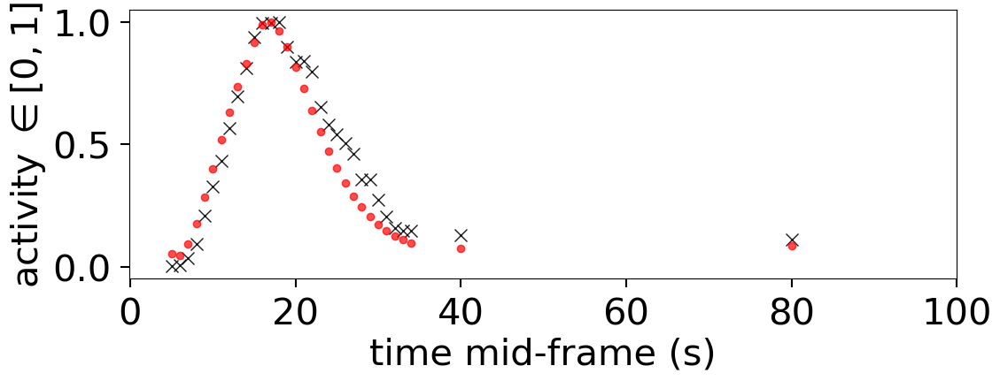

In [7]:
#y = rstate.normal(ypred, bc.truths[-1])
y = bc.input_func_measurement['img']
y = y / np.max(y)

# plot results
plt.figure(figsize=(12, 5))
plt.plot(x, y, color='black', marker='x', 
         ls='none', alpha=0.9, markersize=10)
plt.plot(x, ypred, marker='o', color='red', ls='none', alpha=0.7)
plt.xlim([-0.1, 100])
plt.xlabel('time mid-frame (s)')
plt.ylabel('activity $\in [0,1]$')
plt.tight_layout()

Let's sample from this distribution using the default `dynesty` settings with `'slice'`.

In [8]:
def loglike(v):
    return Boxcar.loglike(v, y)

In [9]:
#import warnings
#warnings.simplefilter("error", RuntimeWarning)

# sample
sampler = dynesty.DynamicNestedSampler(loglike, bc.prior_transform, 14, 
                                sample='rslice', nlive=2000,
                                rstate=rstate)
sampler.run_nested(checkpoint_file=bc.fqfp+"_dynesty-Boxcar.save")
res = sampler.results

/Users/jjlee/PycharmProjects/dynesty/idif2024/Artery.py:122: RuntimeWarning: invalid value encountered in multiply
  rho = np.power(t_, a) * np.exp(-np.power((b * t_), p))
/Users/jjlee/PycharmProjects/dynesty/idif2024/Artery.py:125: RuntimeWarning: invalid value encountered in divide
  rho = rho / np.max(rho)
iter: 2999 | batch: 0 | bound: 0 | nc: 6 | ncall: 7252 | eff(%): 32.415 | loglstar:   -inf < -2636.955 <    inf | logz: -2645.207 +/-    nan | dlogz: 2661.307 >  0.010                               IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

iter: 7296 | batch: 0 | bound: 1 | nc: 82 | ncall: 80195 | eff(%):  8.876 | loglstar:   -inf < -587.376 <    inf | logz: -597.391 +/-    nan | dlogz: 646.247 >  0.010       

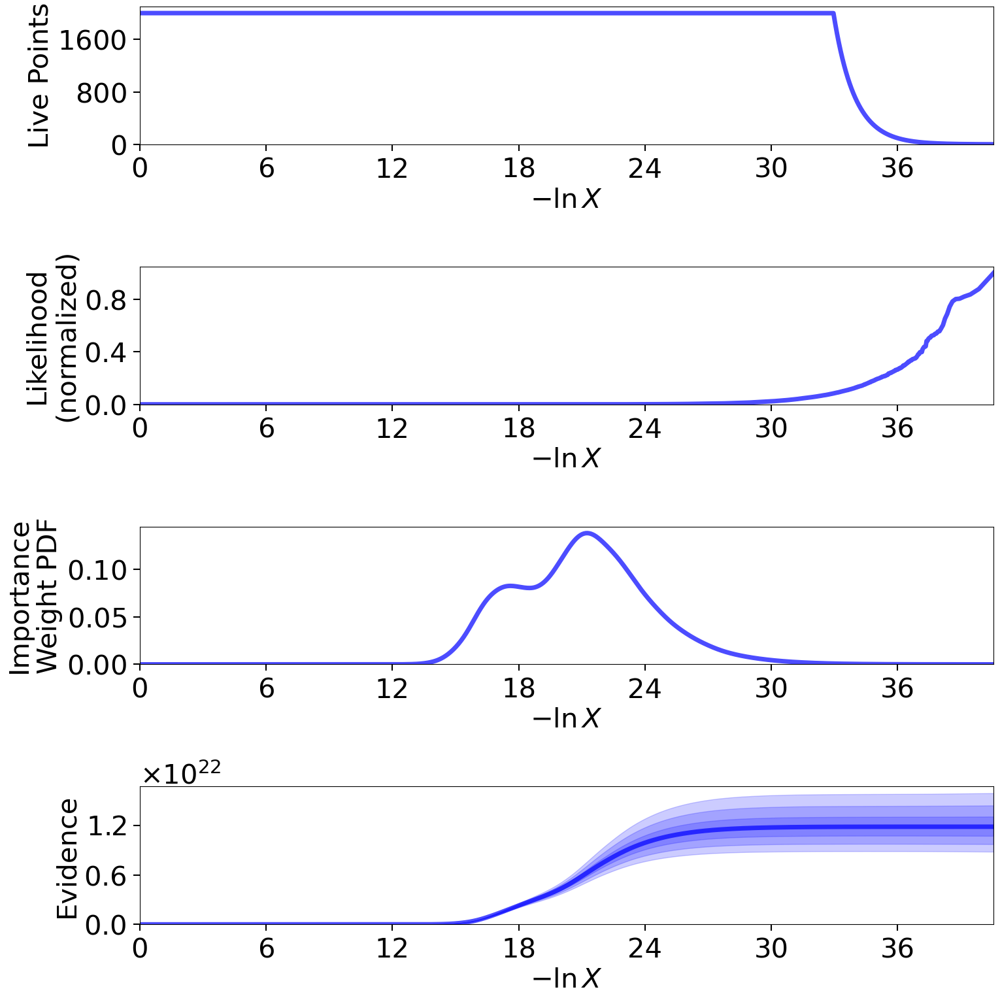

In [10]:
from dynesty import plotting as dyplot

dyplot.runplot(res)
plt.tight_layout()

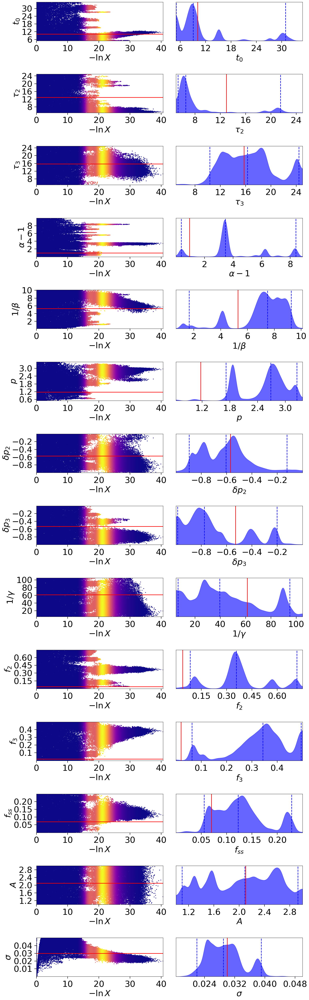

In [11]:
labels = bc.labels
truths = bc.truths
fig, axes = dyplot.traceplot(res, labels=labels, truths=truths,
                             fig=plt.subplots(14, 2, figsize=(16, 50)))
fig.tight_layout()

In [12]:
fig, axes = dyplot.cornerplot(res, truths=truths, show_titles=True, 
                              title_kwargs={'y': 1.04}, labels=labels,
                              fig=plt.subplots(14, 14, figsize=(100, 100)))

In [13]:
res

         niter: 67903
         ncall: array([1, 1, 1, ..., 1, 1, 1])
           eff: 0.860468466998057
       samples: array([[1.48436009e+01, 2.42895601e+01, 2.38737351e+01, ...,
        1.19784088e-01, 2.73193238e+00, 4.79543138e-02],
       [1.74922550e+01, 1.71179918e+01, 1.14488938e+01, ...,
        8.69050152e-02, 2.68717150e+00, 4.63319940e-02],
       [3.01497635e+01, 6.54362613e+00, 1.66539395e+01, ...,
        1.91706026e-01, 1.22070843e+00, 3.04227321e-03],
       ...,
       [1.17809328e+01, 5.54949152e+00, 1.33424936e+01, ...,
        1.18877853e-01, 2.77834918e+00, 2.12008345e-02],
       [1.13916900e+01, 5.63434320e+00, 1.00146405e+01, ...,
        1.15290792e-01, 2.26509176e+00, 1.95882072e-02],
       [1.15425821e+01, 5.49173891e+00, 1.06028126e+01, ...,
        1.11591880e-01, 1.40477833e+00, 1.99796396e-02]])
    samples_id: array([   1,    2,    6, ..., 1516,  851, 1747])
 samples_batch: array([0, 0, 0, ..., 0, 0, 0])
    samples_it: array([    0,     0,     0, ...,

In [15]:
res.keys()

['niter',
 'ncall',
 'eff',
 'samples',
 'samples_id',
 'samples_batch',
 'samples_it',
 'samples_u',
 'samples_n',
 'logwt',
 'logl',
 'logvol',
 'logz',
 'batch_nlive',
 'batch_bounds',
 'blob',
 'logzerr',
 'information',
 'bound',
 'bound_iter',
 'samples_bound',
 'scale']

In [22]:
res['samples'].shape

(67903, 14)

In [23]:
res.importance_weights().shape

(67903,)

In [27]:
from dynesty import utils as dyutils

samples = res['samples']
weights = res.importance_weights()
for i, x in enumerate(samples):
    ql, qm, qh = dyutils.quantile(x, [0.025, 0.5, 0.975], weights=weights)
    print(f"Parameter {i+1}: {qm:.3f} [{ql:.3f}, {qh:.3f}]")

ValueError: Dimension mismatch: len(weights) != len(x).